#SteGuz : Image Steganography using CNN
### A Tensorflow Implementation
#### Published June 2022


## Imports

In [1]:
%pylab inline
%load_ext tensorboard
import glob
import os
from PIL import Image,ImageOps
import matplotlib.pyplot as plt
import pathlib
import random
import pandas as pd


import tensorflow as tf

import tensorflow_datasets as tfds
import time
from datetime import datetime
from os.path import join
from tensorflow.keras import layers, optimizers
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator


#image metrics:
import numpy as np
from skimage import data, img_as_float
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error

#for use in mounting google drive image dataset
from google.colab import drive
drive.mount('/content/drive')

#tf.enable_eager_execution()
#tf.compat.v1.enable_eager_execution()
#tf.config.run_functions_eagerly(True)

Populating the interactive namespace from numpy and matplotlib
Mounted at /content/drive


## Configuration
All Configuration related information is represented in CAPS

In [2]:
ROOT_PATH = "/content/drive/MyDrive/"
GDRIVE_PATH = ROOT_PATH + "Yashi/"
TRAIN_PATH = ROOT_PATH + "Training-Data/"
LOGS_PATH = GDRIVE_PATH + "logs/"
CHECKPOINTS_PATH = GDRIVE_PATH + "Saved-Stego-Models/checkpoints_NoNL/"
SAVED_STEGO_MODEL_DIRECTORY_PATH = GDRIVE_PATH + "Saved-Stego-Models/"
MODEL_PATH = SAVED_STEGO_MODEL_DIRECTORY_PATH
METRIC_TESTING_IMAGES_PATH = GDRIVE_PATH + "Results/Final Network/"
SHOULD_CONTINUE_TRAINING_NETWORK = True
model_paths_list = ['/content/drive/MyDrive/Yashi/Saved-Stego-Models/']
# Batch size refers to the number of examples from the training dataset that are used in the estimate of the error
# gradient. Smaller batch sizes are preferred over larger ones because small batch sizes are noisy, which offer a regularizing
# effect and lower generalization error. They also make it easier to fit one batch worth of training data in memory.
#BATCH_SIZE = 50
BATCH_SIZE = 32

EPOCHS = 1
# The learning rate is a hyperparameter that controls how much the model changes in response to the estimated error
# each time the model weights are updated. A small learning rate may result in a long training process, while a large
# learning rate may result in learning a sub-optimal set of weights too quickly or an unstable training process.
# The learning rate may be the most important hyperparameter when configuring the neural network.
#
# Source: https://machinelearningmastery.com/understand-the-dynamics-of-learning-rate-on-deep-learning-neural-networks/
#LEARNING_RATE = .0001
LEARNING_RATE = .0002
optimizer = tf.optimizers.Adam(learning_rate=LEARNING_RATE)
# Momentum is used to increase the speed of the optimization process.
BETA = .75
#BETA = .5

# Save the model as Trained_Model_Month_Day_Year_HH_MM_SS
#currentDateTime = datetime.now().strftime("%B_%m_%Y_%H_%M_%S")
#Changed by @Khalifa
currentDateTime = datetime.now().strftime("%m-%d-%Y")
EXP_NAME = f"Final_Trained_Model_P75_TF2_{currentDateTime}"

## Method definitions
The images are first converted to float values between 0 and 1.





In [3]:
def get_img_batch(files_list, batch_size=32, size=(224, 224)):
    batch_cover = []
    batch_secret = []

    for i in range(batch_size):
        img_secret_path = random.choice(files_list)
        img_cover_path = random.choice(files_list)

        img_secret = load_img(img_secret_path).convert("RGB")
        img_cover = load_img(img_cover_path).convert("RGB")

        img_secret = img_to_array(ImageOps.fit(img_secret, size))
        img_cover = img_to_array(ImageOps.fit(img_cover, size))

        img_secret /= 255.
        img_cover /= 255.

        batch_cover.append(img_cover)
        batch_secret.append(img_secret)

    batch_cover, batch_secret = np.array(batch_cover), np.array(batch_secret)

    return batch_cover, batch_secret


def get_conv_branch(input_tensor, kernel_size, filters, layers_count):
    x = input_tensor
    for _ in range(layers_count):
        x = tf.keras.layers.Conv2D(filters, kernel_size, padding='same', activation='relu')(x)
    return x

def get_prep_network_op(secret_tensor):
    # Branches with different kernel sizes
    conv_3x3_branch = get_conv_branch(secret_tensor, 3, 50, 5)
    conv_4x4_branch = get_conv_branch(secret_tensor, 4, 50, 5)
    conv_5x5_branch = get_conv_branch(secret_tensor, 5, 50, 5)

    # Concatenating the output of each branch
    concat_1 = tf.keras.layers.Concatenate(axis=3)([conv_3x3_branch, conv_4x4_branch, conv_5x5_branch])

    # Additional layers after concatenation
    final_3x3 = tf.keras.layers.Conv2D(50, 3, padding='same', activation='relu')(concat_1)
    final_4x4 = tf.keras.layers.Conv2D(50, 4, padding='same', activation='relu')(concat_1)
    final_5x5 = tf.keras.layers.Conv2D(50, 5, padding='same', activation='relu')(concat_1)

    # Final concatenation
    concat_final = tf.keras.layers.Concatenate(axis=3)([final_3x3, final_4x4, final_5x5])

    return concat_final



def get_hiding_network_op(cover_tensor, prep_output):
    # Concatenate cover and prep output
    concat_input = tf.keras.layers.Concatenate(axis=3)([cover_tensor, prep_output])

    # Branches with different kernel sizes
    conv_3x3_branch = get_conv_branch(concat_input, 3, 50, 5)
    conv_4x4_branch = get_conv_branch(concat_input, 4, 50, 5)
    conv_5x5_branch = get_conv_branch(concat_input, 5, 50, 5)

    # Concatenating the output of each branch
    concat_1 = tf.keras.layers.Concatenate(axis=3)([conv_3x3_branch, conv_4x4_branch, conv_5x5_branch])

    # Final layers
    final_3x3 = tf.keras.layers.Conv2D(50, 3, padding='same', activation='relu')(concat_1)
    final_4x4 = tf.keras.layers.Conv2D(50, 4, padding='same', activation='relu')(concat_1)
    final_5x5 = tf.keras.layers.Conv2D(50, 5, padding='same', activation='relu')(concat_1)

    # Final concatenation
    concat_final = tf.keras.layers.Concatenate(axis=3)([final_3x3, final_4x4, final_5x5])

    # Output layer
    output = tf.keras.layers.Conv2D(3, 1, padding='same', activation='relu')(concat_final)

    return output


def get_reveal_network_op(container_tensor):
    # Branches with different kernel sizes
    conv_3x3_branch = get_conv_branch(container_tensor, 3, 50, 5)
    conv_4x4_branch = get_conv_branch(container_tensor, 4, 50, 5)
    conv_5x5_branch = get_conv_branch(container_tensor, 5, 50, 5)

    # Concatenating the output of each branch
    concat_1 = tf.keras.layers.Concatenate(axis=3)([conv_3x3_branch, conv_4x4_branch, conv_5x5_branch])

    # Final layers
    final_3x3 = tf.keras.layers.Conv2D(50, 3, padding='same', activation='relu')(concat_1)
    final_4x4 = tf.keras.layers.Conv2D(50, 4, padding='same', activation='relu')(concat_1)
    final_5x5 = tf.keras.layers.Conv2D(50, 5, padding='same', activation='relu')(concat_1)

    # Final concatenation
    concat_final = tf.keras.layers.Concatenate(axis=3)([final_3x3, final_4x4, final_5x5])

    #Output layer
    output = tf.keras.layers.Conv2D(3, 1, padding='same', activation='relu')(concat_final)
    return output

class StegoModel(tf.keras.Model):
    def __init__(self):
        super(StegoModel, self).__init__()
        # Example: Defining layers for prep, hide, and reveal networks
        self.prep_net_layers = [tf.keras.layers.Conv2D(50, 3, padding='same', activation='relu') for _ in range(5)]
        self.hide_net_layers = [tf.keras.layers.Conv2D(50, 3, padding='same', activation='relu') for _ in range(5)]
        self.reveal_net_layers = [tf.keras.layers.Conv2D(50, 3, padding='same', activation='relu') for _ in range(5)]

        # Output layers for hiding and revealing networks
        self.hide_net_output = tf.keras.layers.Conv2D(3, 1, padding='same', activation='relu')
        self.reveal_net_output = tf.keras.layers.Conv2D(3, 1, padding='same', activation='relu')

    def call(self, inputs):
        secret_tensor, cover_tensor = inputs

        # Prep network forward pass
        x = secret_tensor
        for layer in self.prep_net_layers:
            x = layer(x)
        prep_output = x

        # Hiding network forward pass
        x = tf.keras.layers.Concatenate(axis=3)([cover_tensor, prep_output])
        for layer in self.hide_net_layers:
            x = layer(x)
        hiding_output = self.hide_net_output(x)

        # Reveal network forward pass
        x = hiding_output
        for layer in self.reveal_net_layers:
            x = layer(x)
        reveal_output = self.reveal_net_output(x)

        return reveal_output, hiding_output

# Initialize the model
model = StegoModel()

def get_loss_op(secret_true, secret_pred, cover_true, cover_pred, beta=BETA):
    #alpha = 0.84  # Adjust this to balance between MSE and SSIM components

    # Mean Squared Error
    secret_mse = tf.reduce_mean(tf.square(secret_true - secret_pred))
    cover_mse = tf.reduce_mean(tf.square(cover_true - cover_pred))

    # Structural Similarity Index (SSIM)
    secret_ssim_loss = 1 - tf.reduce_mean(tf.image.ssim(secret_true, secret_pred, 1.0))
    cover_ssim_loss = 1 - tf.reduce_mean(tf.image.ssim(cover_true, cover_pred, 1.0))

    # Combined loss: weighted sum of MSE and SSIM losses
    mse_loss = cover_mse + secret_mse
    ssim_loss = cover_ssim_loss + secret_ssim_loss
    final_loss = (1 - beta) * mse_loss + beta * ssim_loss

    return final_loss, secret_mse, cover_mse


def prepare_training_step():
    optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE)
    @tf.function
    def train_step(secret_tensor, cover_tensor):
        with tf.GradientTape() as tape:
            reveal_output, hiding_output = model((secret_tensor, cover_tensor))
            loss, secret_loss, cover_loss = get_loss_op(secret_tensor, reveal_output, cover_tensor, hiding_output)

        gradients = tape.gradient(loss, model.trainable_variables)
        optimizer.apply_gradients(zip(gradients, model.trainable_variables))
        return loss, secret_loss, cover_loss

    return train_step


def prepare_test_step():
    @tf.function
    def test_step(secret_tensor, cover_tensor):
        prep_output = get_prep_network_op(secret_tensor)
        hiding_output = get_hiding_network_op(cover_tensor, prep_output)
        reveal_output = get_reveal_network_op(hiding_output)
        loss, secret_loss, cover_loss = get_loss_op(secret_tensor, reveal_output, cover_tensor, hiding_output)

        return loss, secret_loss, cover_loss, hiding_output, reveal_output

    return test_step


def prepare_deployment_function():
    @tf.function
    def deployment_function(secret_tensor, cover_tensor, covered_tensor):
        prep_output = get_prep_network_op(secret_tensor)
        hiding_output = get_hiding_network_op(cover_tensor, prep_output)
        reveal_output = get_reveal_network_op(covered_tensor)

        return hiding_output, reveal_output

    return deployment_function


import os
import tensorflow as tf

def run_training():
    train_step = prepare_training_step()
    files_list = glob.glob(join(TRAIN_PATH + "imagenette/", "*")) + glob.glob(join(TRAIN_PATH + "Linnaeus/**/*", "*.jpg"), recursive=True)
    total_steps = len(files_list) // BATCH_SIZE

    # Create a Checkpoint that will manage objects with state
    epoch = tf.Variable(0, dtype=tf.int64)
    step = tf.Variable(0, dtype=tf.int64)
    checkpoint = tf.train.Checkpoint(model=model, optimizer=optimizer, epoch=epoch, step=step)
    checkpoint_manager = tf.train.CheckpointManager(checkpoint, directory=CHECKPOINTS_PATH, max_to_keep=5)

    # Restore the latest checkpoint if it exists
    if checkpoint_manager.latest_checkpoint:
        checkpoint.restore(checkpoint_manager.latest_checkpoint)
        print("Restored from checkpoint at epoch", epoch.numpy(), "and step", step.numpy())
    else:
        print("Starting from scratch")

    for ep in range(epoch.numpy(), 10):
        for st in range(step.numpy(), total_steps):
            covers, secrets = get_img_batch(files_list, BATCH_SIZE)
            loss, secret_loss, cover_loss = train_step(secrets, covers)

            # Update the step
            step.assign_add(1)

            if st % 10 == 0:
                print(f"Epoch {ep}, Step {st}, Loss: {loss}, Secret Loss: {secret_loss}, Cover Loss: {cover_loss}")

            # Save a checkpoint every 'n' steps (e.g., 100)
            if st % 100 == 0:
                checkpoint_manager.save()

        # Update the epoch and reset the step for the next epoch
        epoch.assign_add(1)
        step.assign(0)

    # Save the final model
    model.save(join(MODEL_PATH, f"StegoModel_{datetime.now().strftime('%Y%m%d_%H%M%S')}"))



# Network Training

In [ ]:
run_training()

Restored from checkpoint at epoch 3 and step 101
Epoch 3, Step 110, Loss: 0.6818622350692749, Secret Loss: 0.13859517872333527, Cover Loss: 0.010434672236442566
Epoch 3, Step 120, Loss: 0.28849363327026367, Secret Loss: 0.036992188543081284, Cover Loss: 0.010480417869985104
Epoch 3, Step 130, Loss: 0.2360832393169403, Secret Loss: 0.018204784020781517, Cover Loss: 0.008851769380271435
Epoch 3, Step 140, Loss: 0.19370533525943756, Secret Loss: 0.01488138735294342, Cover Loss: 0.010176880285143852
Epoch 3, Step 150, Loss: 0.17936834692955017, Secret Loss: 0.01635846495628357, Cover Loss: 0.008922678418457508
Epoch 3, Step 160, Loss: 0.13465818762779236, Secret Loss: 0.015298854559659958, Cover Loss: 0.007550069130957127
Epoch 3, Step 170, Loss: 0.1357433944940567, Secret Loss: 0.007678075693547726, Cover Loss: 0.007816730998456478
Epoch 3, Step 180, Loss: 0.1287812888622284, Secret Loss: 0.010592181235551834, Cover Loss: 0.008961500599980354
Epoch 3, Step 190, Loss: 0.12309443950653076, 

# Loading "a" Fully-trained Model

In [5]:
import tensorflow as tf
from datetime import datetime

inputModelPath = input("Enter the model path to load: ")
if not inputModelPath:
    inputModelPath = "StegoModel_20240115_231211_P25"  # Default model

MODEL_PATH = SAVED_STEGO_MODEL_DIRECTORY_PATH + inputModelPath

try:
    model = tf.keras.models.load_model(MODEL_PATH)
    print("Model " + MODEL_PATH + " successfully restored.")
except Exception as e:
    print("Error loading model:", e)
    now = datetime.now()
    dt_string = now.strftime("%d-%m-%Y_%H_%M_%S")
    inputModelPath = "TrainedModel-" + dt_string
    MODEL_PATH = SAVED_STEGO_MODEL_DIRECTORY_PATH + inputModelPath
    print("This model cannot be restored or does not exist. Defaulting to " + MODEL_PATH)


Enter the model path to load: 


Model /content/drive/MyDrive/Yashi/Saved-Stego-Models/StegoModel_20240115_231211_P25 successfully restored.


# Experimental Results
### Calculate Performance metrics on sample (Cover/Secret) image pairs

1/1 [==============================] - 0s 205ms/step


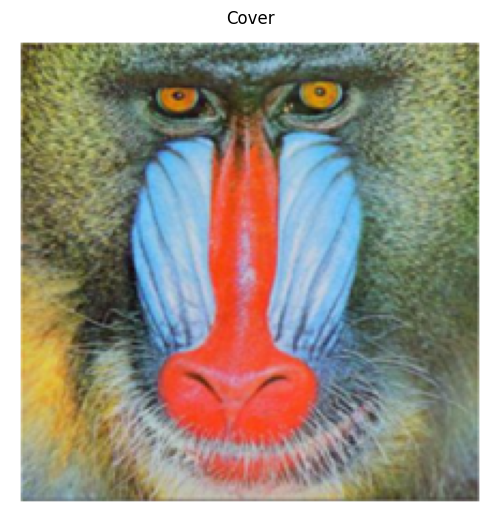

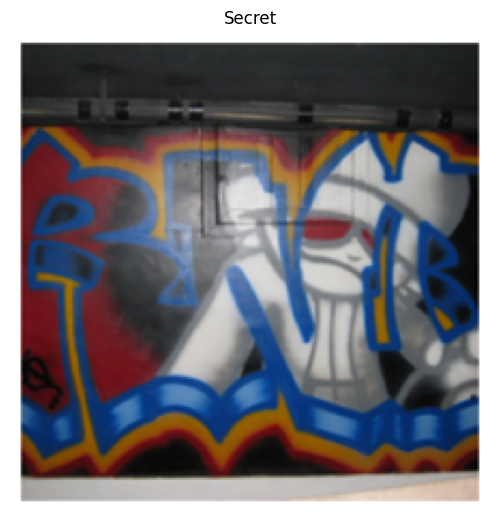

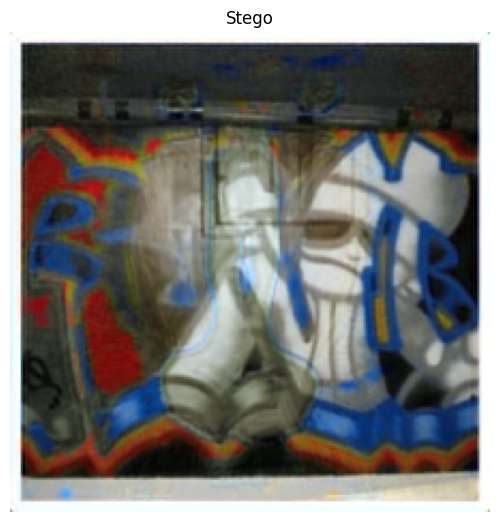

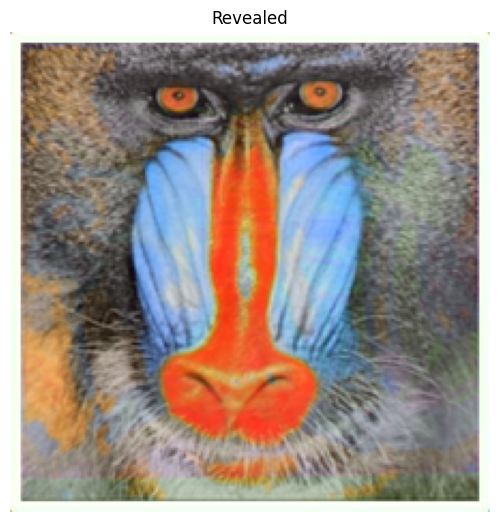

<ipython-input-6-a426ea30cc79>:49: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  coverAndStegoPSNR = peak_signal_noise_ratio(coverImg, stegoImg[0])
<ipython-input-6-a426ea30cc79>:50: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  secretAndExtractedSSIM = ssim(hiddenImg, extractedImg[0], multichannel=True)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:348: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  return func(*args, **kwargs)


PSNR between cover and stego image (imperceptibility): 10.648828059076891
SSIM between secret and extracted image (recoverability): 0.28409204544821987
1/1 [==============================] - 0s 67ms/step


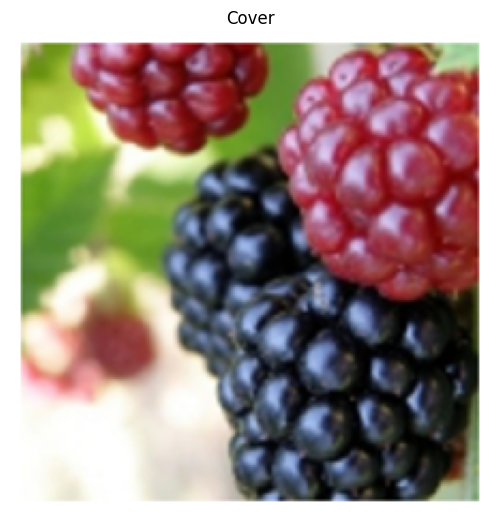

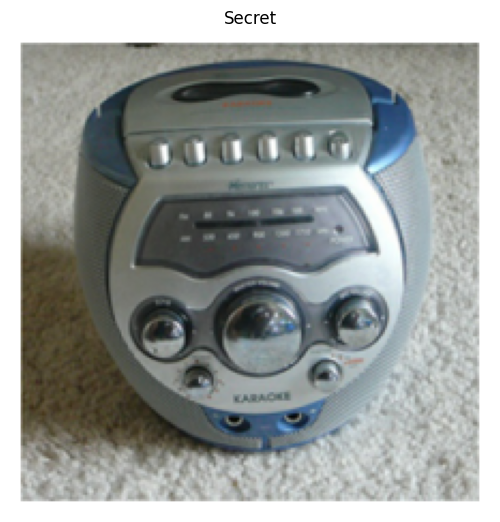

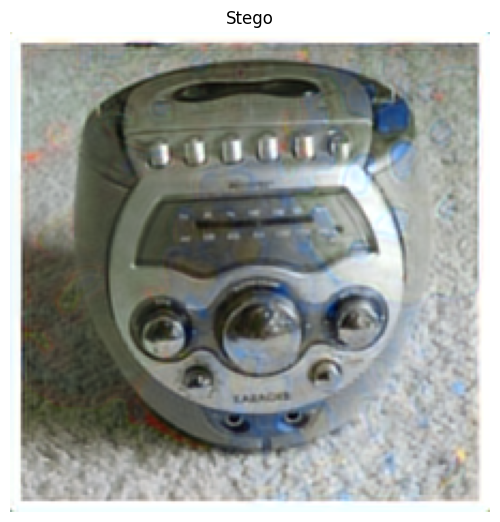

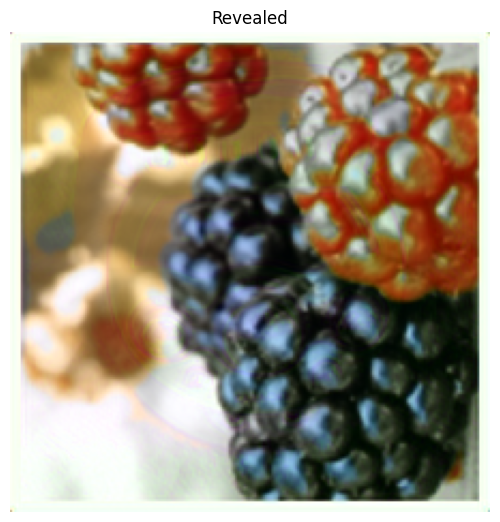

PSNR between cover and stego image (imperceptibility): 8.214133851067873
SSIM between secret and extracted image (recoverability): 0.2571578653454284
1/1 [==============================] - 0s 71ms/step


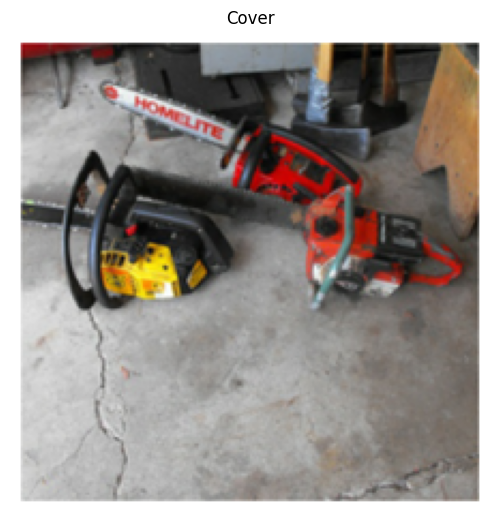

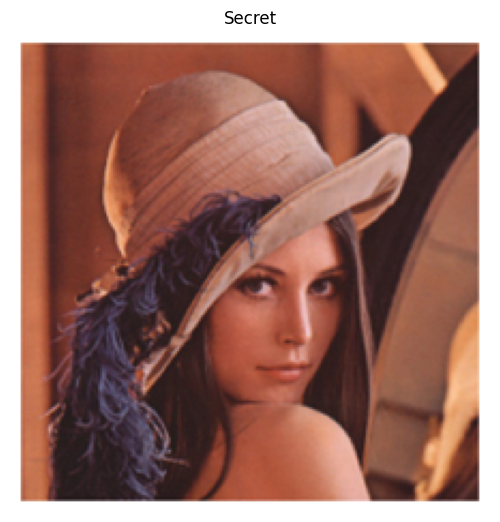

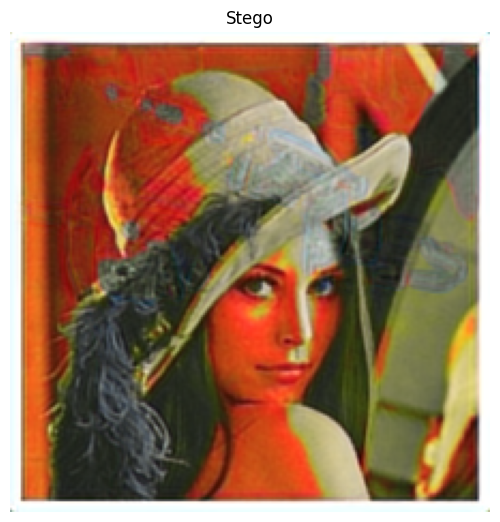

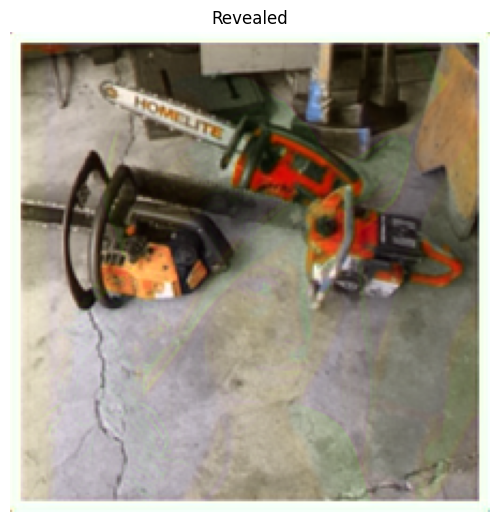

PSNR between cover and stego image (imperceptibility): 9.054502578792317
SSIM between secret and extracted image (recoverability): 0.3705142769028405
1/1 [==============================] - 0s 71ms/step


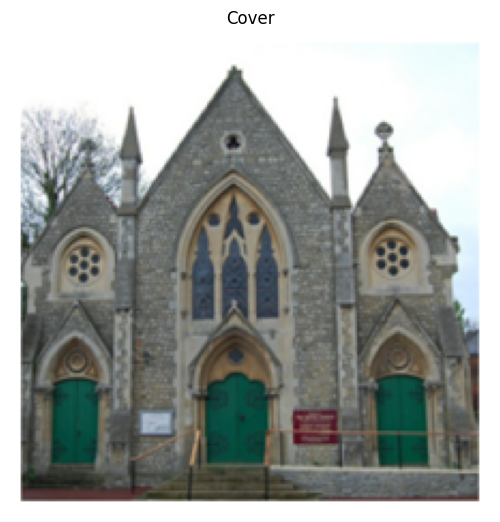

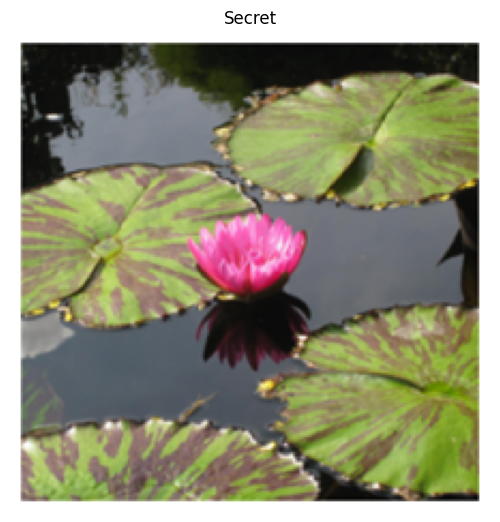

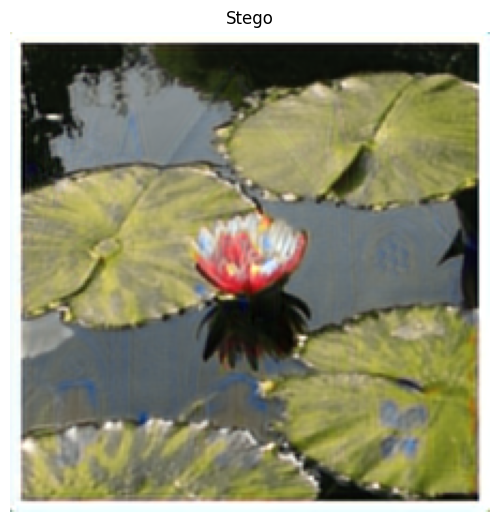

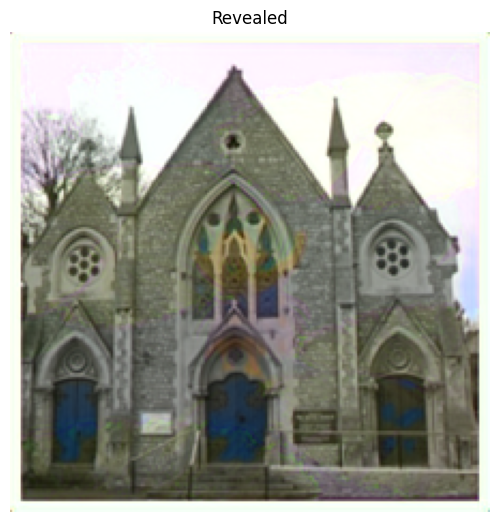

PSNR between cover and stego image (imperceptibility): 8.47245687041667
SSIM between secret and extracted image (recoverability): 0.3125352423557437
1/1 [==============================] - 0s 66ms/step


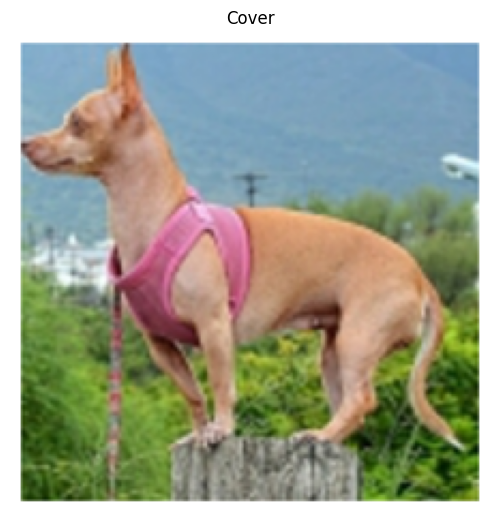

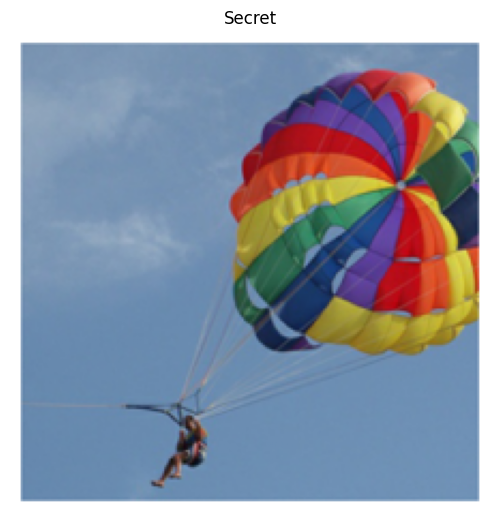

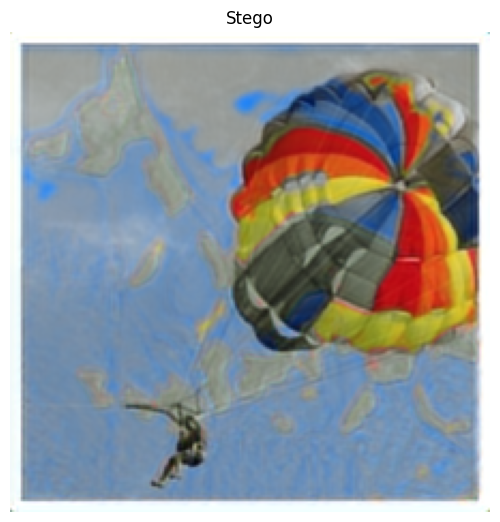

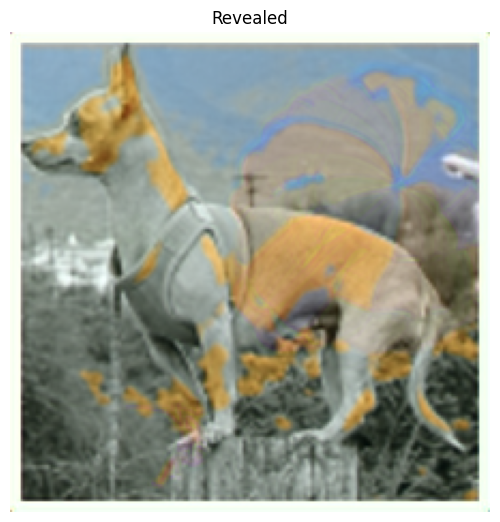

PSNR between cover and stego image (imperceptibility): 12.070866645674796
SSIM between secret and extracted image (recoverability): 0.5014307058797721
1/1 [==============================] - 0s 68ms/step


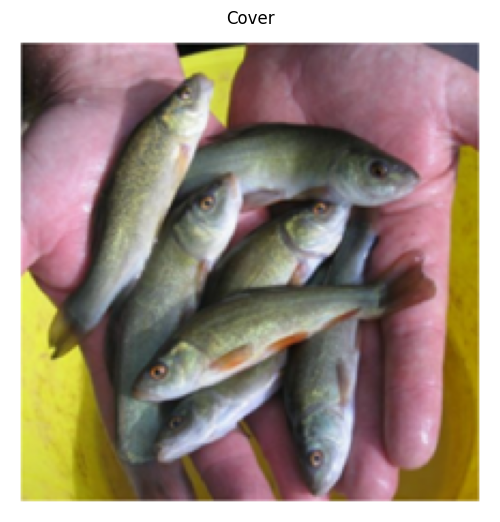

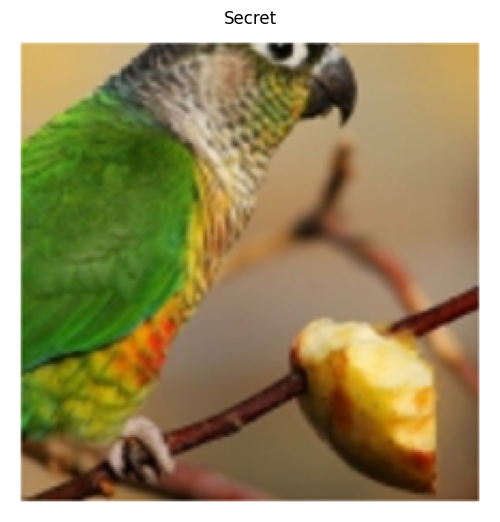

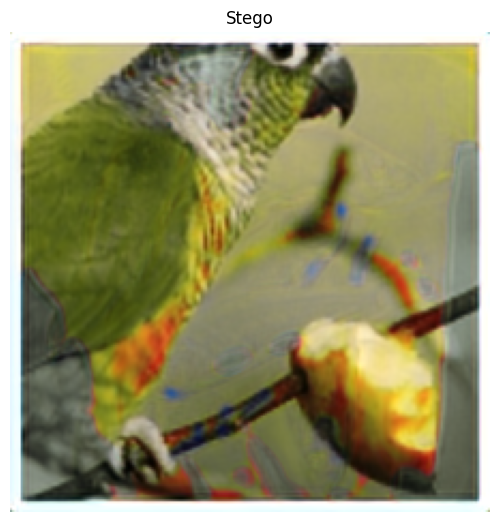

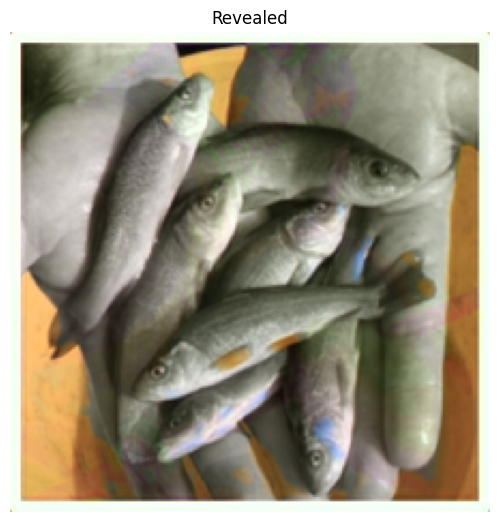

PSNR between cover and stego image (imperceptibility): 10.759342699395113
SSIM between secret and extracted image (recoverability): 0.3668368316350707
1/1 [==============================] - 0s 68ms/step


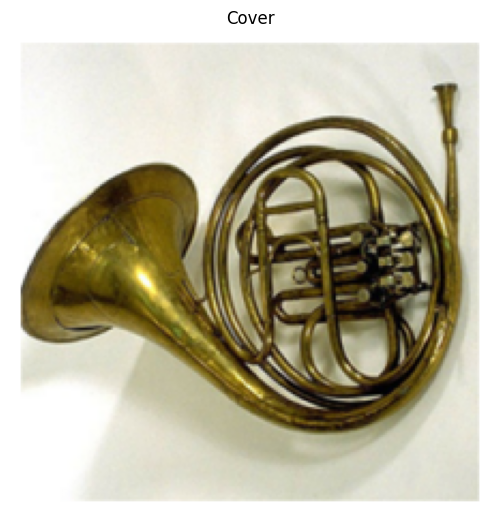

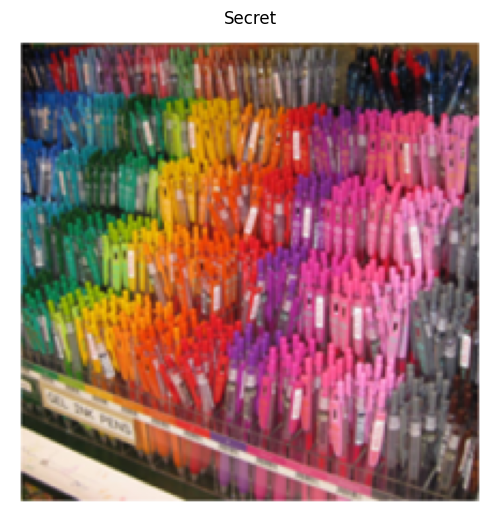

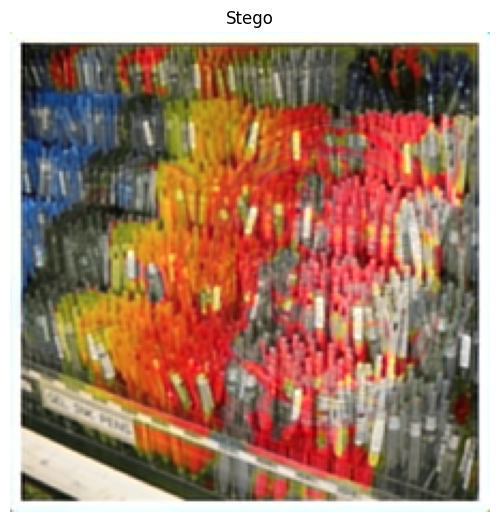

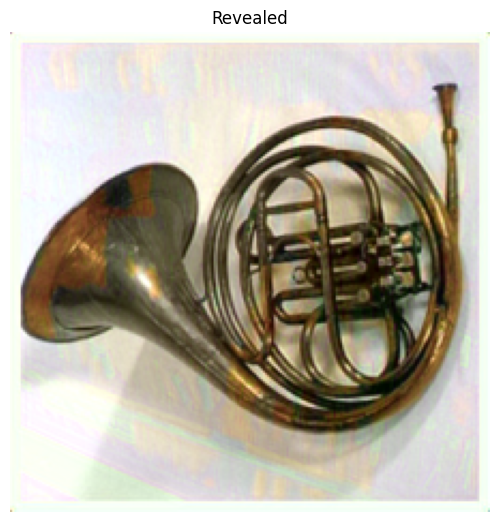

PSNR between cover and stego image (imperceptibility): 7.162005953634798
SSIM between secret and extracted image (recoverability): 0.17823426999325617
1/1 [==============================] - 0s 66ms/step


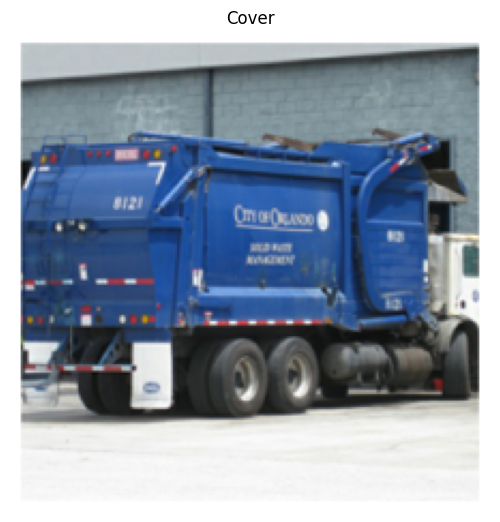

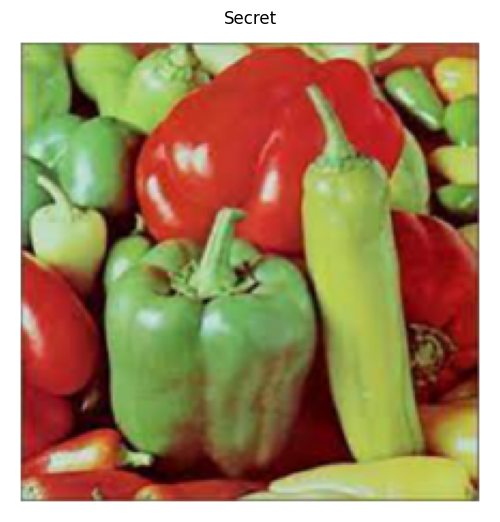

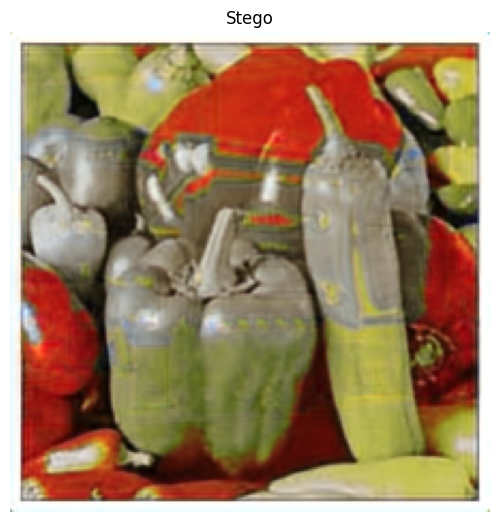

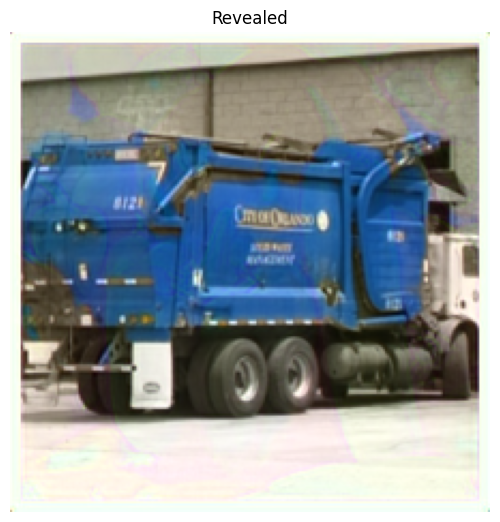

PSNR between cover and stego image (imperceptibility): 8.546007641518052
SSIM between secret and extracted image (recoverability): 0.2741273193513865
1/1 [==============================] - 0s 66ms/step


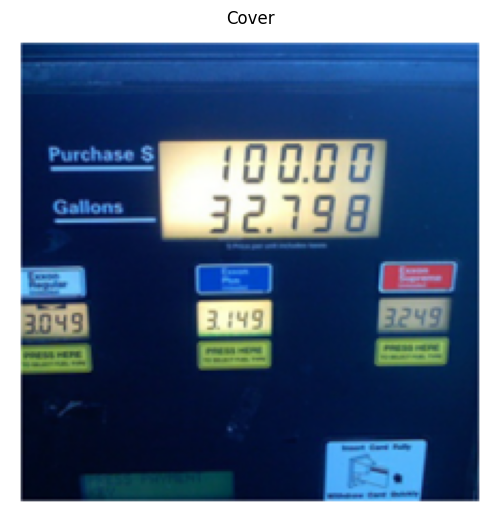

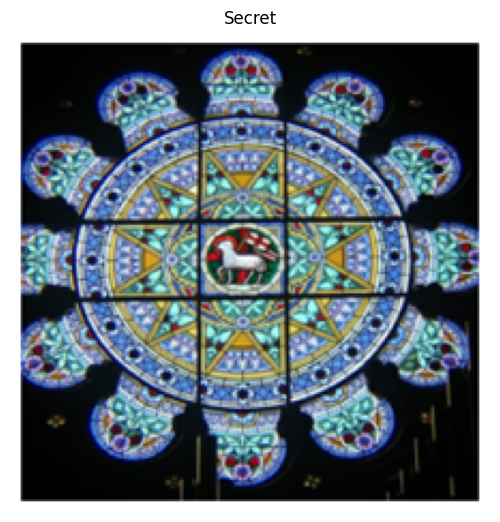

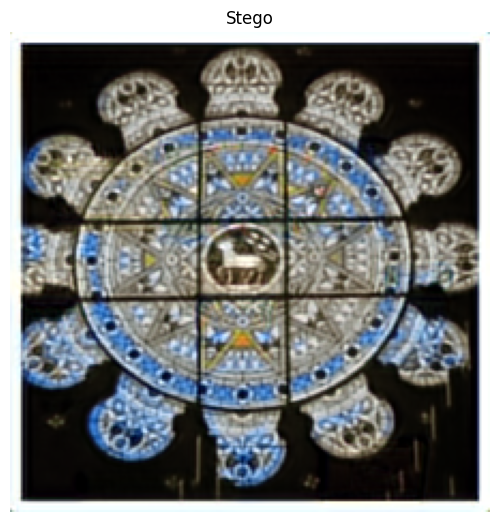

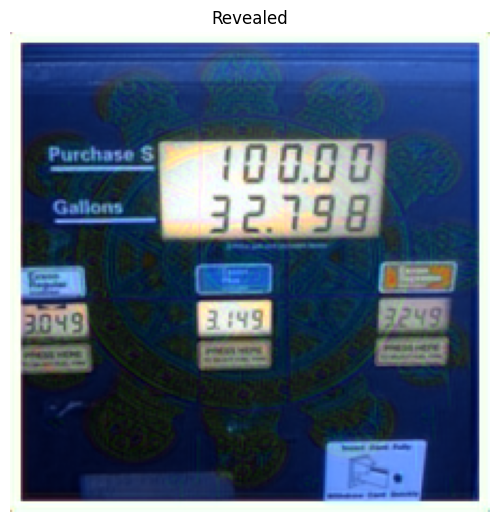

PSNR between cover and stego image (imperceptibility): 9.03897814287436
SSIM between secret and extracted image (recoverability): 0.17793260024792235
1/1 [==============================] - 0s 67ms/step


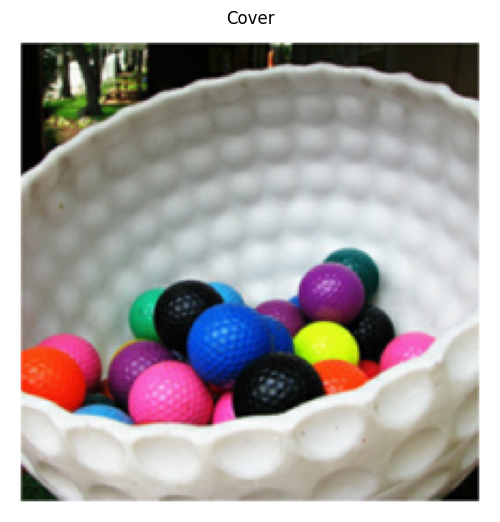

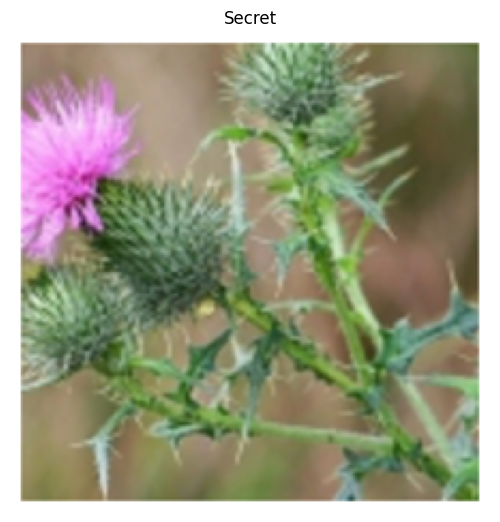

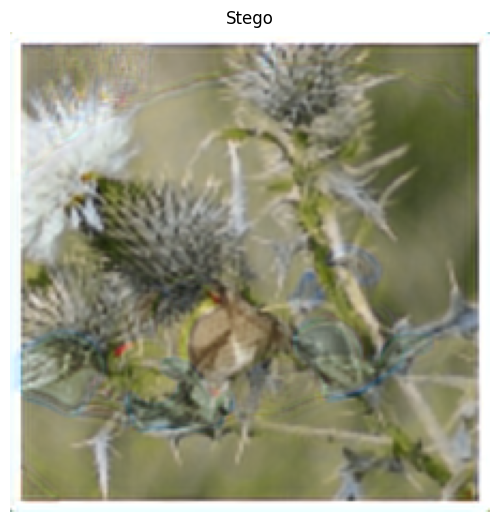

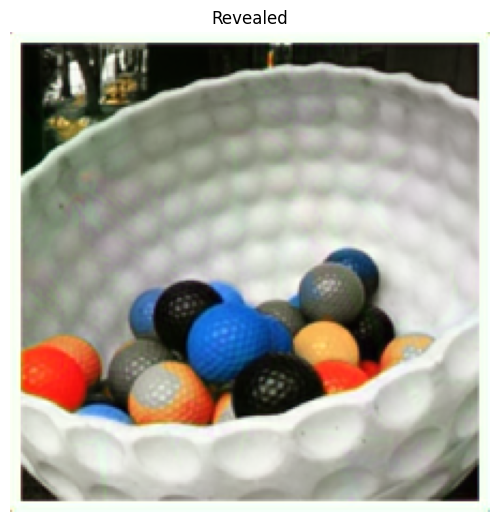

PSNR between cover and stego image (imperceptibility): 9.645415611076796
SSIM between secret and extracted image (recoverability): 0.3549564906522565


In [6]:
import pandas as pd
from skimage import img_as_float
from skimage.metrics import structural_similarity as ssim, peak_signal_noise_ratio, mean_squared_error
from PIL import Image
import matplotlib.pyplot as plt

def preprocess_image(img_path):
    img = Image.open(img_path)
    if img.mode == 'RGBA':
        img = img.convert('RGB')
    img = img.resize((224, 224))
    return img_as_float(img)

# List of cover and hidden images
coverImgs = ["Baboon", "Berries", "Chainsaws", "Church", "Dog", "Fish", "French Horn", "Garbage Truck", "Gas Pump", "Golf Balls"]
hiddenImgs = ["Graffiti", "Karaoke", "Lena", "Lotus", "Parachute", "Parrot", "Pens", "Peppers", "Stained Glass", "Thistle"]
fileType = ".png"

# Assuming model is already loaded here as 'model'
# model = tf.keras.models.load_model(MODEL_PATH)

results_list = []

for x in range(10):
    coverImgFileName = "/content/drive/MyDrive/Yashi/Test Images/" + coverImgs[x] + fileType
    hiddenImgFileName = "/content/drive/MyDrive/Yashi/Test Images/" + hiddenImgs[x] + fileType

    coverImg = preprocess_image(coverImgFileName)
    hiddenImg = preprocess_image(hiddenImgFileName)

    # Prepare input for the model
    input_data = [hiddenImg[np.newaxis, ...], coverImg[np.newaxis, ...]]

    # Generate stego and extracted images using the model
    stegoImg, extractedImg = model.predict(input_data)

    # Display images
    images = [coverImg, hiddenImg, stegoImg[0], extractedImg[0]]
    titles = ["Cover", "Secret", "Stego", "Revealed"]

    for img, title in zip(images, titles):
        plt.axis('off')
        plt.tight_layout(pad=0)
        plt.imshow(img.squeeze())
        plt.title(title)
        plt.show()

    # Compute metrics
    coverAndStegoPSNR = peak_signal_noise_ratio(coverImg, stegoImg[0])
    secretAndExtractedSSIM = ssim(hiddenImg, extractedImg[0], multichannel=True)

    print("PSNR between cover and stego image (imperceptibility):", coverAndStegoPSNR)
    print("SSIM between secret and extracted image (recoverability):", secretAndExtractedSSIM)

    # Append results to results_list
    results_list.append(["SteGuz", "Stego", coverImgs[x], coverAndStegoPSNR, "N/A", "No"])
    results_list.append(["SteGuz", "Extracted", hiddenImgs[x], "N/A", secretAndExtractedSSIM, "No"])

# Convert results_list to DataFrame and save to CSV
df = pd.DataFrame(results_list, columns=['Model', 'ImageType', 'ImageName', 'PSNR', 'SSIM', 'Noise Layer'])
df.to_csv("/content/drive/MyDrive/Yashi/Saved-Stego-Models/Results_P75.csv", index=False)


In [ ]:
#Testing the Model
#Calculate the network metrics, such as PSNR, SSIM, MSE, etc.
#Created by Anthony

from skimage.metrics.simple_metrics import peak_signal_noise_ratio

coverImgs = ["Baboon", "Berries", "Chainsaws", "Church", "Dog", "Fish", "French Horn", "Garbage Truck", "Gas Pump", "Golf Balls"]
hiddenImgs = ["Graffiti", "Karaoke", "Lena", "Lotus", "Parachute", "Parrot", "Pens", "Peppers", "Stained Glass", "Thistle"]
fileType = ".png"

for x in range(10):

  coverImgFileName = "/content/drive/MyDrive/Yashi/Test Images/" + coverImgs[x] + fileType
  stegoImgFileName = "/content/drive/MyDrive/Yashi/Test Images//" + coverImgs[x] + fileType
  hiddenImgFileName = "/content/drive/MyDrive/Yashi/Test Images//" + hiddenImgs[x] + fileType
  extractedImgFileName = "/content/drive/MyDrive/Yashi/Test Images//" + hiddenImgs[x] + fileType

  #coverImgFileName = "/content/drive/MyDrive/Colab Notebooks/testing_images/Original Version Output Cover"  + fileType
  #stegoImgFileName = "/content/drive/MyDrive/Colab Notebooks/testing_images/Original Version Output Stego"  + fileType
  #hiddenImgFileName = "/content/drive/MyDrive/Colab Notebooks/testing_images/Original Version Output Hidden"  + fileType
  #extractedImgFileName = "/content/drive/MyDrive/Colab Notebooks/testing_images/Original Version Output Extracted"  + fileType

  coverImg =     img_as_float(Image.open(coverImgFileName))
  stegoImg =     img_as_float(Image.open(stegoImgFileName))
  hiddenImg =    img_as_float(Image.open(hiddenImgFileName))
  extractedImg = img_as_float(Image.open(extractedImgFileName))

  #print("Cover: " + coverImgs[x] +  "     Hidden: " + hiddenImgs[x])

  OriginalNetworkStegoSSIM = ssim(coverImg, stegoImg, multichannel=True)
  print("SSIM between cover and stego image: " + str(float(format(OriginalNetworkStegoSSIM, '.5f'))))

  #PSNR
  OriginalNetworkStegoPSNR = peak_signal_noise_ratio(coverImg, stegoImg)
  #OriginalNetworkRecoveredPSNR = peak_signal_noise_ratio(hiddenImg, extractedImg)
  print("PSNR between cover and stego image: " + str(float(format(OriginalNetworkStegoPSNR, '.5f'))))
  #print("PSNR between hidden and extracted image: " + str(OriginalNetworkRecoveredPSNR))

  #MSE
  #coverAndHiddenMSE = mean_squared_error(coverImg, stegoImg)
  OriginalNetworkRecoveredSSIM = ssim(hiddenImg, extractedImg, multichannel=True)
  print("SSIM between hidden and extracted image: " + str(float(format(OriginalNetworkRecoveredSSIM, '.5f'))))
  secretAndExtractedMSE = mean_squared_error(hiddenImg, extractedImg)
  #print("MSE between cover and stego image: " + str(coverAndHiddenMSE))
  print("MSE between hidden and extracted image: " + str(float(format(secretAndExtractedMSE, '.5f'))))
  print("")